# MLP Language Model

In [2]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
words = open('names.txt').read().splitlines()

In [4]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i + 1 for i, s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s, i in stoi.items()}

### preparing dataset

In [150]:
# build dataset
def build_dataset(words):
  block_size = 3
  X, Y = [], []

  for word in words:
    context = [0] * block_size
    for ch in word + '.':
      ix = stoi[ch]
      X.append(context)
      Y.append(ix)
      context = context[1:] + [ix]

  X = torch.tensor(X)
  Y = torch.tensor(Y)
  print(X.shape, Y.shape)

  return X, Y

import random
random.shuffle(words)
n1 = int(0.8 * len(words))
n2 = int(0.9 * len(words))

Xtr, Ytr = build_dataset(words[:n1])
Xdev, Ydev = build_dataset(words[n1:n2])
Xt, Yt = build_dataset(words[n2:])

torch.Size([182590, 3]) torch.Size([182590])
torch.Size([22856, 3]) torch.Size([22856])
torch.Size([22700, 3]) torch.Size([22700])


In [255]:
# init params

C = torch.randn((27, 16)) # embedding
W1 = torch.randn((48, 300))
b1 = torch.randn(300)
W2 = torch.randn((300, 27))
b2 = torch.randn(27)

parameters = [C, W1, W2, b1, b2]
for p in parameters:
  p.requires_grad = True

In [256]:
sum(p.nelement() for p in parameters)

23259

In [257]:
lre = torch.linspace(-3, 0, 1000)
lrs = 10**lre

lri = []
lossi = []
stepi = []

In [258]:
epochs = 500000

for epoch in range(epochs):
  # mini batch of 32
  ix = torch.randint(0, Xtr.shape[0], (100,))

  # forward pass
  emb = C[Xtr[ix]]
  h = torch.tanh(emb.view(-1, 48) @ W1 + b1)
  logits = h @ W2 + b2
  loss = F.cross_entropy(logits, Ytr[ix])
  print(f'loss = {loss.item()}')
  
  for p in parameters:
    p.grad = None

  loss.backward()

  lr = 0.1 if epoch < 100000 else 0.01
  for p in parameters:
    # p.data -= lrs[epoch] * p.grad
    p.data -= lr * p.grad

  # track
  # lri.append(lre[epoch])
  lossi.append(loss.log10().item())
  stepi.append(epoch)


loss = 31.364768981933594
loss = 30.876384735107422
loss = 28.415624618530273
loss = 28.55996322631836
loss = 25.754806518554688
loss = 24.371305465698242
loss = 23.098655700683594
loss = 23.300256729125977
loss = 22.89349365234375
loss = 22.642778396606445
loss = 21.175914764404297
loss = 19.629383087158203
loss = 21.66741943359375
loss = 21.969741821289062
loss = 19.142162322998047
loss = 19.8147029876709
loss = 20.53850555419922
loss = 17.740949630737305
loss = 15.142969131469727
loss = 17.2098388671875
loss = 18.4268856048584
loss = 18.89049530029297
loss = 17.906919479370117
loss = 16.465761184692383
loss = 13.866589546203613
loss = 17.33810806274414
loss = 18.103639602661133
loss = 14.59271240234375
loss = 13.899927139282227
loss = 15.782862663269043
loss = 15.025975227355957
loss = 13.988358497619629
loss = 15.580053329467773
loss = 15.23114013671875
loss = 15.193975448608398
loss = 12.455453872680664
loss = 11.541132926940918
loss = 13.480428695678711
loss = 14.17785358428955
l

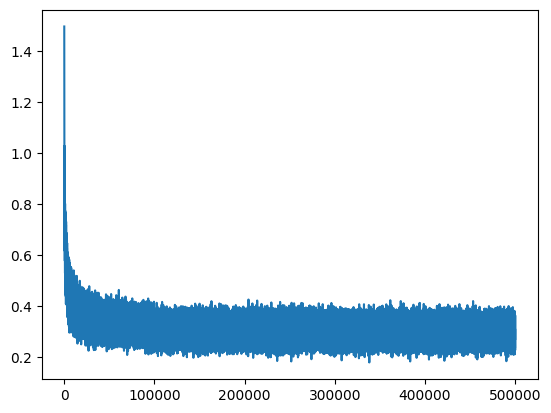

In [259]:
plt.plot(stepi, lossi)

In [260]:
emb = C[Xdev]
h = torch.tanh(emb.view(-1, 48) @ W1 + b1)
logits = h @ W2 + b2
loss = F.cross_entropy(logits, Ydev)
loss.item()

2.148876428604126

In [261]:
emb = C[Xtr]
h = torch.tanh(emb.view(-1, 48) @ W1 + b1)
logits = h @ W2 + b2
loss = F.cross_entropy(logits, Ytr)
loss.item()

2.0141026973724365

In [275]:
# evaluation
for _ in range(20):
  out = []
  context = [0] * 3

  while True:
    emb = C[torch.tensor([context])]
    h = torch.tanh(emb.view(1, -1) @ W1 + b1)
    logits = h @ W2 + b2
    probs = F.softmax(logits, dim=1)
    ix = torch.multinomial(probs, num_samples=1, replacement=True).item()
    context = context[1:] + [ix]
    out.append(ix)

    if ix == 0:
      break

  print(''.join(itos[i] for i in out))

elia.
ece.
fre.
araw.
mayudian.
aval.
amora.
prahlissa.
jeanarith.
broushawn.
emerion.
ley.
ani.
rebeck.
kyan.
eidorepaytlyn.
aliannon.
haliestlynn.
tyki.
denzie.
